# Melanoma Classification using Create ML and Integration into an iOS App

## Step 1: Import your Dataset to Create ML

The first step in the process is to upload your dataset into Create ML.  This should be done in a folder system, where each set of images for each respective class is in its own folder labeled as the class.  After Google AutoML I decided to start with a balanced dataset and I also added a 3rd class called Other.  Other is a colleciton of random images so that when a picture of a non mole is uploaded to the app the correct classification is made and confidence in the prediciton isn't undermined.  Once your dataset is uploaded to Create ML you can see the class distribution:
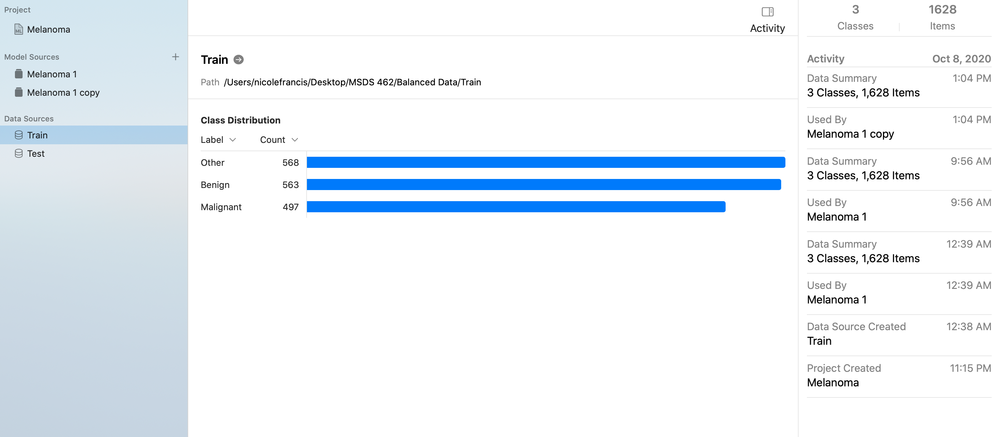

## Step 2: Setup the Training Settings

In the settings tab of Create ML you can set the number of iterations (default is 25) and you can add data augmentation to your model such as noise, blur, crop, expose, flip, and rotate.  I trained multiple models and found that data augmenation didn't help and significantly lengthened training time.  
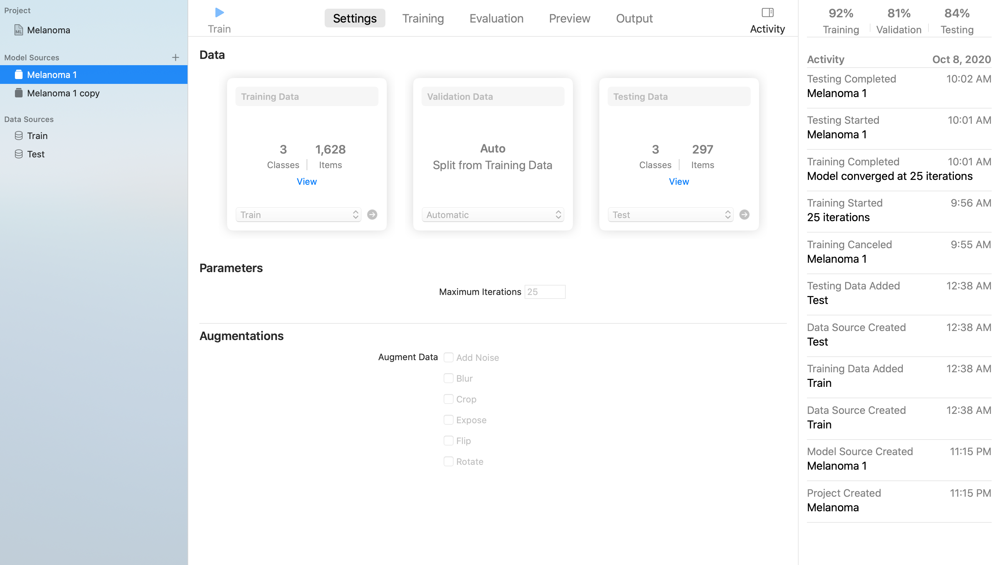

## Step 3: Train the Model

Click train after your settings are set. Depending on your settings and the size of your dataset the model can take anywhere from 15 minutes to hours to train.  Once the model is finished you will see the chart displayed below along with the accuracy metrics for Training, Validation, and Testing.
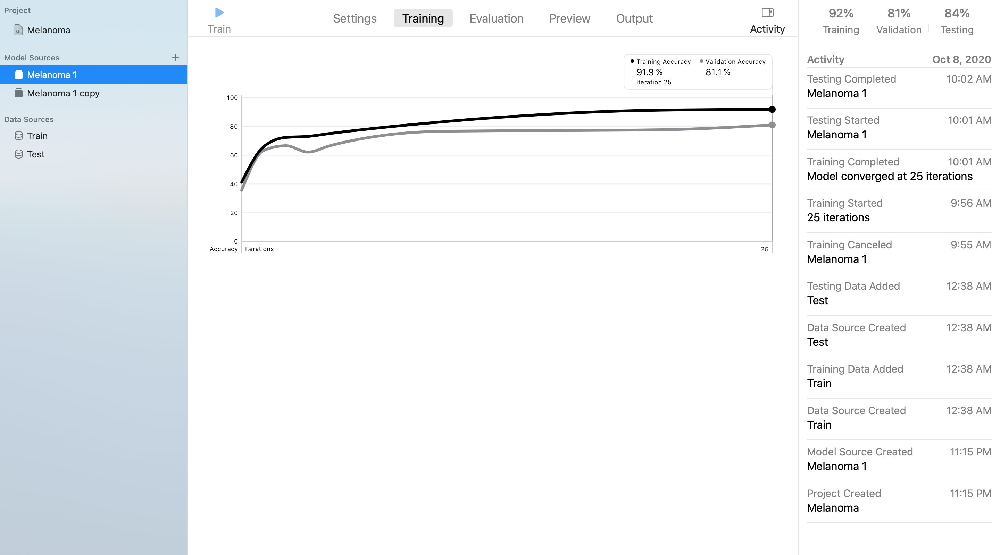
This particular model achieved 84% accuracy on the test dataset.

## Step 4: Evaulate the Model

Once the model is done training you are able to click on the Evaluation tab.  Within this tab you will see the item count, precision, and recall by class for your model.  Depedning on your use case you may want to optimize for precision or recall in produciton (a false negative could be worse than a false positive).
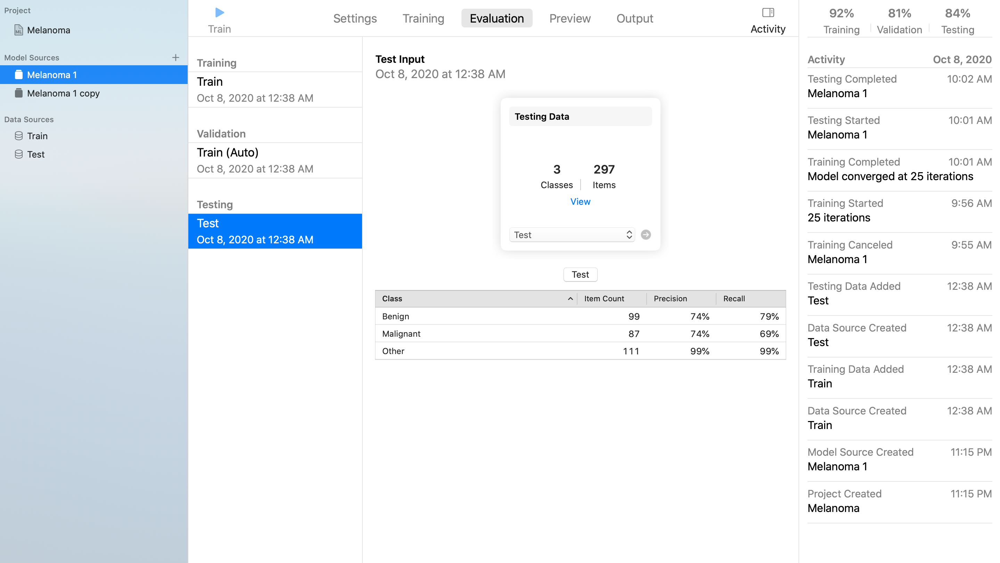

## Step 5: Output the Model to .mlmodel

Next, click on the output tab.  There are two options for integrating your model into an iOS app: you can open the model direclty in Xcode and build your application or you can download your model (Get) and drag it into an already built app.  Downloading the model and dragging it into the Apple Vision Classificaiton Sample Project is the easiest method to get an app up and running quickly.
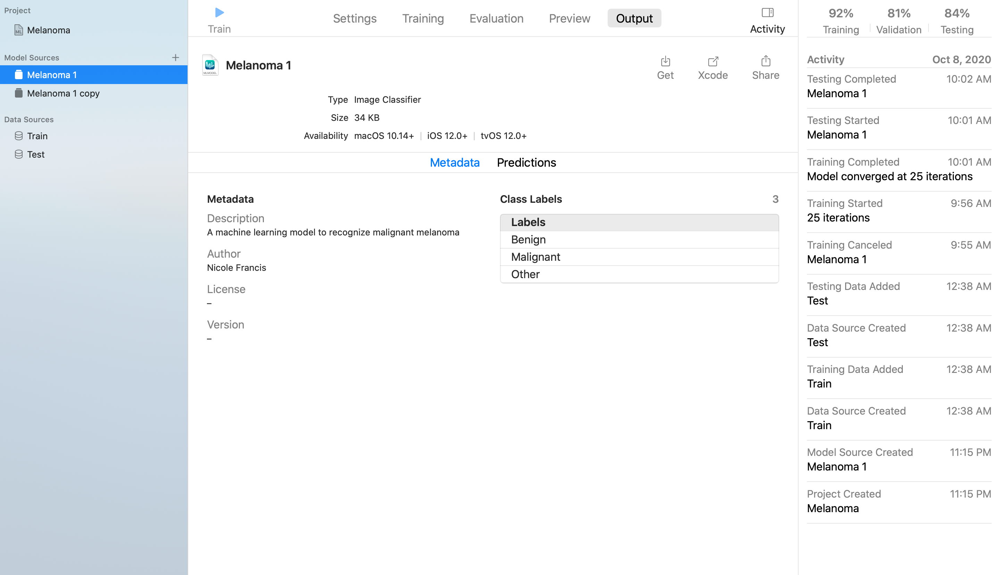

## Step 6: Drag the Model into Xcode and change Swift Code

Once you have downloaded your model you can drag it into the Xcode project.  The only line of code that will need to be changed is line 31 (let model = try VNCoreMLModel(for: MobileNet().model) ).  The MobileNet will need to be replaced with the name of your model, in this case Melanoma1.
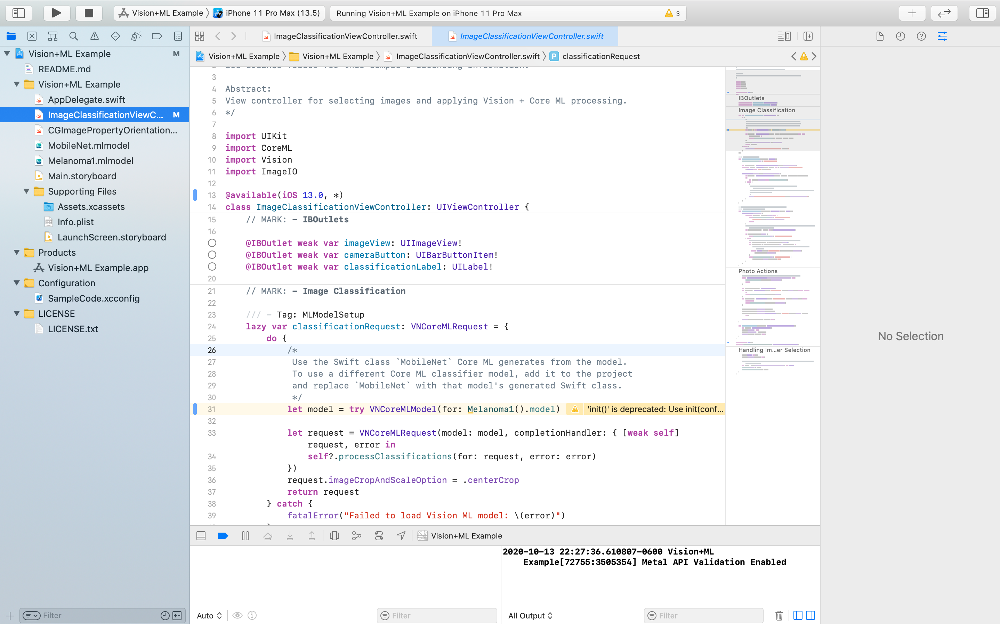

## Step 7: Click Build

Make sure you are running an iOS simulator that is iOS 13.0 or later (this example uses the iPone 11 Pro Max 13.5 simulator).  The simulator will take some time to load but you will then be taken to the iPhone:
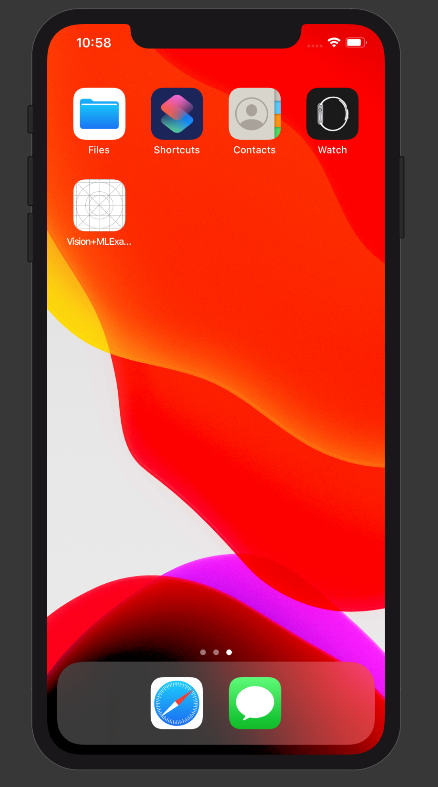

## Step 8: Upload Pictures to the Simulator And Launch App

You can drag additional images onto the iPhone simulator and they will be added to the photos app.  The simulator behaves exactly like any iPhone.  Once you have uploaded your images click your app (Vision+MLExample).  Once you are in your app you can choose a picture to be classified by your model:
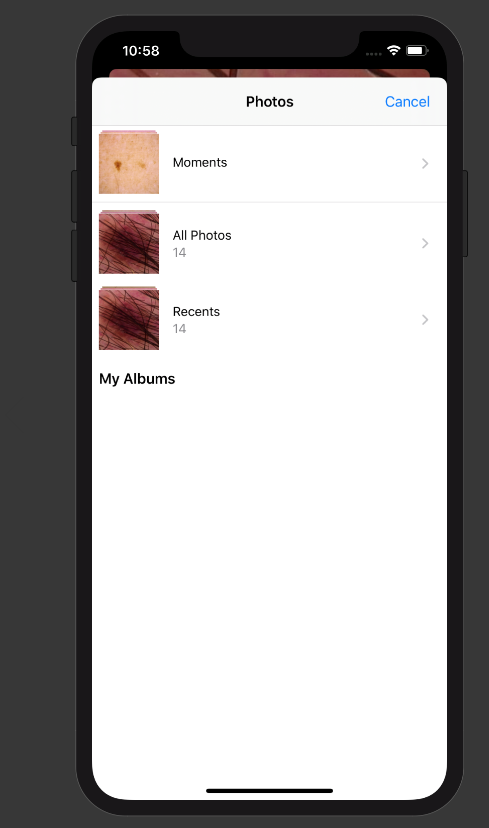

## Step 9: Make Predictions

Once you have selected an image your model will score the image and classify it into the respective class. 
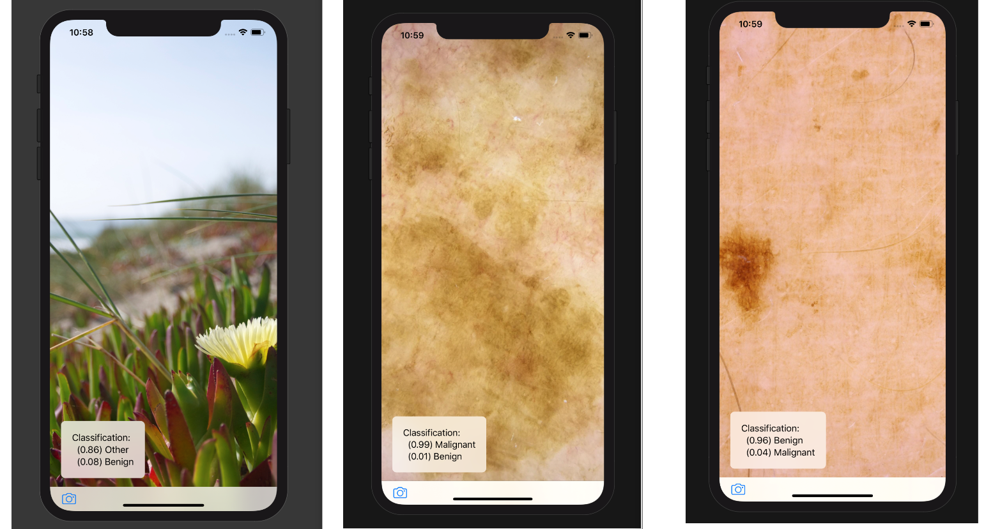

# Conclusion

Create ML worked flawlessly and was much easier than training a model locally and using coremltools or by training a model on Google AutoML and exporting to mlmodel.  The app works without any issues, however, the model could be improved.  When making medical predictions we want the model to be as accurate as possible and that would require more extensive training.  As mentioned previously, a false negative is much worse than a false postive.  A false negative (told benign when actually malignant) gives a user the false sense that they shouldn't see a doctor.  A false postive (told malignant when actually benign), while still a bad thing, is not as bad because the user is sent to a doctor and perhaps the doctor catches something else that the user wasn't thinking about.